# NLP Pipeline Jupyter Notebook for the aiTextDetect Project: Step 4

## Data Analysis and Data Visualization

This jupyter notebook uses the features generated in step 3 to create some data visualization and data analysis.

In [1]:
import pandas as pd
import plotnine as p9
import numpy as np
from plotnine import *
from scipy import stats

In [2]:
#save a list of all the features
feature_var = ['total_word_count','avg_word_length', 'avg_sentence_length','TTR', 'stop_word_count', 'unique_word_count', 'rare_word_count','avg_sentence_length.1',  'avg_parse_tree_depth','parse_tree_depth_variation', 'avg_adjectives_per_sentence', 'avg_adverbs_per_sentence',      'avg_verbs_per_sentence', 'avg_nouns_per_sentence', "0", 'flesch_reading_ease',  'flesch_kincaid_grade_level',' smog_index',  'sentiment_polarity','sentiment.subjectivity',    'perplexity']

In [3]:
#read in the data
df = pd.read_excel("../cleanData/featuresAsap.xlsx")

In [4]:
#remove irrelevant columns
df_fig = df.drop(["Unnamed: 0.1", "Unnamed: 0", "essay_id", "essay_set", "essay", "ai_llm", 'word_tokens',  'sentence_tokens',  'lemmatized_word_tokens',  "word_freq", "bigram_freq", "trigram_freq", 0], axis = 1)


In [5]:
#compare means on features
means = df.drop(["Unnamed: 0.1", "Unnamed: 0", "essay_id", "essay_set", "essay", "ai_llm", "word_freq", "bigram_freq", "trigram_freq", 0], axis = 1).groupby(["ai_generated"]).mean().T
means

ai_generated,0,1
total_word_count,254.365455,249.663970
avg_word_length,3.940145,4.319662
avg_sentence_length,20.488947,20.147229
TTR,0.550562,0.536543
stop_word_count,115.831608,109.614088
unique_word_count,78.012214,96.549039
rare_word_count,78.012214,96.549039
avg_sentence_length.1,20.546746,22.653885
avg_parse_tree_depth,5.046980,5.757604
parse_tree_depth_variation,1.662167,1.834155


In [6]:
#remove outliers to make graph more aesthetic
df_fig = df_fig[(np.abs(stats.zscore(df_fig)) < 3).all(axis=1)]

In [7]:
#rename columns for easier data visualization
df_fig = df_fig.rename(columns = {
  'total_word_count': "Word Count",
        'avg_word_length': "Avg. Word Length",
        'avg_sentence_length1': "Avg. Sentence Length",
        'TTR': "Type-Token Ratio",
        'stop_word_count': "Stop Word Count",
        'unique_word_count': "Unique Word Count",
        'word_freq': "Avg. Word Frequency",
        'rare_word_count': "Rare Word Count",
        "avg_sentence_length.1" : "Avg. Sentence Length",
        "avg_parse_tree_depth" : "Avg. Tree Depth",
        "parse_tree_depth_variation" : "Tree Depth Variation",
        "avg_adjectives_per_sentence" : "Avg. Adjectives/Sentence",
        "avg_verbs_per_sentence" : "Avg. Verbs/Sentence",
        "avg_adverbs_per_sentence" : "Avg. Adverbs/Sentence",
        "avg_nouns_per_sentence" : "Avg. Nouns/Sentence",
        "flesch_reading_ease" : "Reading Ease",
        "flesch_kincaid_grade_level" : "Grade level",
        "smog_index" : "Smog Index",
        "sentiment_polarity" : "Polarity",
        "sentiment.subjectivity" : "Subjectivity",
        "perplexity" : "Perplexity"})

In [8]:
#relabel the ai_generated variable
df_fig["ai_generated"] = df_fig["ai_generated"].replace({0: "Human", 1: "AI" })

In [9]:
df_long = pd.melt(df_fig,id_vars = ["ai_generated"], var_name = "feature", value_name = "value")
print(df_long.columns)
print(df_long.dtypes)

Index(['ai_generated', 'feature', 'value'], dtype='object')
ai_generated     object
feature          object
value           float64
dtype: object


In [10]:
df_long["feature"]=df_long["feature"].astype('category')

In [11]:
#relabel the ai_generated variable
df_long["ai_generated"] = df_long["ai_generated"].replace({0: "Human", 1: "AI" })

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

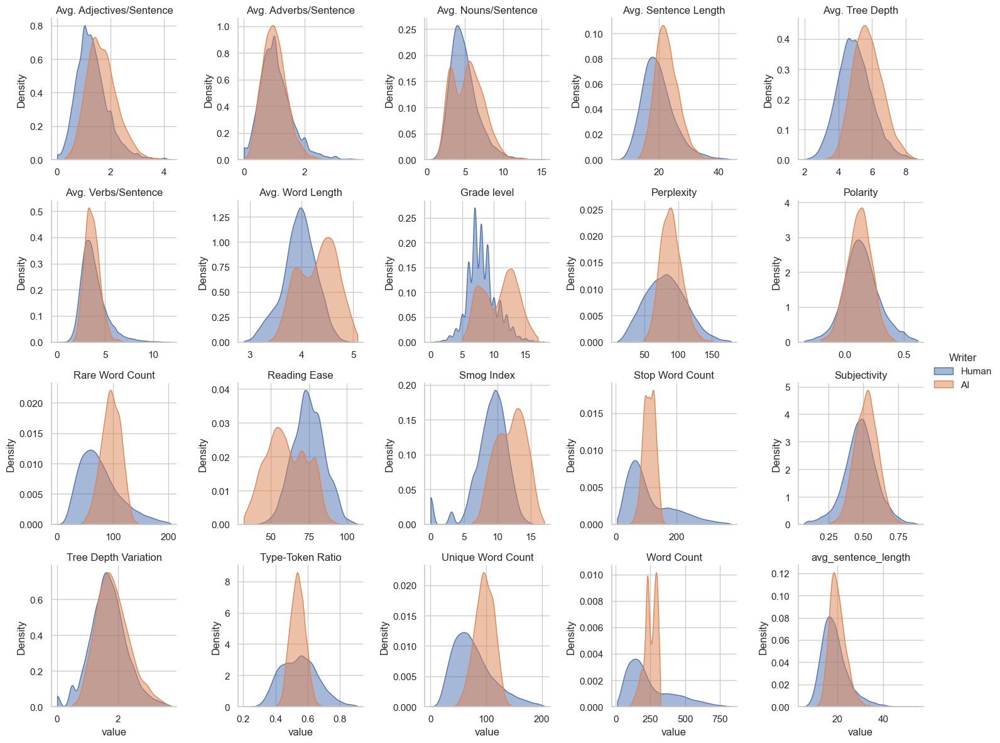

In [13]:
#Creating a small multiple density plot with almost all of the features

# set seaborn whitegrid theme
sns.set(style="whitegrid")

# using small multiple
# create a grid 
g = sns.FacetGrid(df_long, col='feature', hue='ai_generated', col_wrap=5, sharex = False, sharey = False)

# draw density plots
g = g.map(sns.kdeplot,"value", cut=0, fill=True, common_norm=False, alpha=0.5, legend=True, label = "ai_generated")

# control the title of each facet
g = g.set_titles("{col_name}")

g.add_legend(title = "Writer")

sns.FacetGrid.savefig(g, "../output/densityplot.png")

# show the graph
plt.show()


In [14]:
#subset the data to provide subsets of the above graph 
df_subset1 = df_fig.loc[:, ['ai_generated', 'Word Count', 'Avg. Word Length', 'Avg. Sentence Length', 'Type-Token Ratio', 'Stop Word Count', 'Unique Word Count', 'Rare Word Count', 'Avg. Sentence Length']]
df_subset2 = df_fig.loc[:, ["ai_generated", 'Avg. Tree Depth', 'Tree Depth Variation', 'Avg. Adjectives/Sentence',
       'Avg. Adverbs/Sentence', 'Avg. Verbs/Sentence', 'Avg. Nouns/Sentence',
       'Reading Ease', 'Grade level', 'Smog Index', 'Polarity', 'Subjectivity',
       'Perplexity']]

#pivot from wide to long format for data visualization
df_subset1_long = pd.melt(df_subset1,id_vars = ["ai_generated"], var_name = "feature", value_name = "value")
df_subset2_long = pd.melt(df_subset2,id_vars = ["ai_generated"], var_name = "feature", value_name = "value")



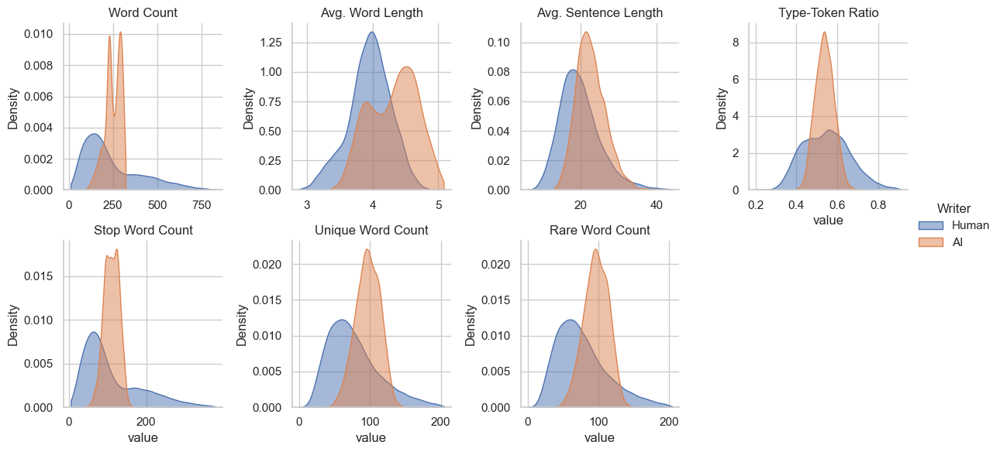

In [15]:
#Small multiple density plot with First 10 features

# set seaborn whitegrid theme
sns.set(style="whitegrid")

# using small multiple
# create a grid 
g = sns.FacetGrid(df_subset1_long, col='feature', hue='ai_generated', col_wrap=4, sharex = False, sharey = False)

# draw density plots
g = g.map(sns.kdeplot,"value", cut=0, fill=True, common_norm=False, alpha=0.5, legend=True, label = "ai_generated")

# control the title of each facet
g = g.set_titles("{col_name}")

g.add_legend(title = "Writer")

sns.FacetGrid.savefig(g, "../output/densityplot_sub1.png")

# show the graph
plt.show()

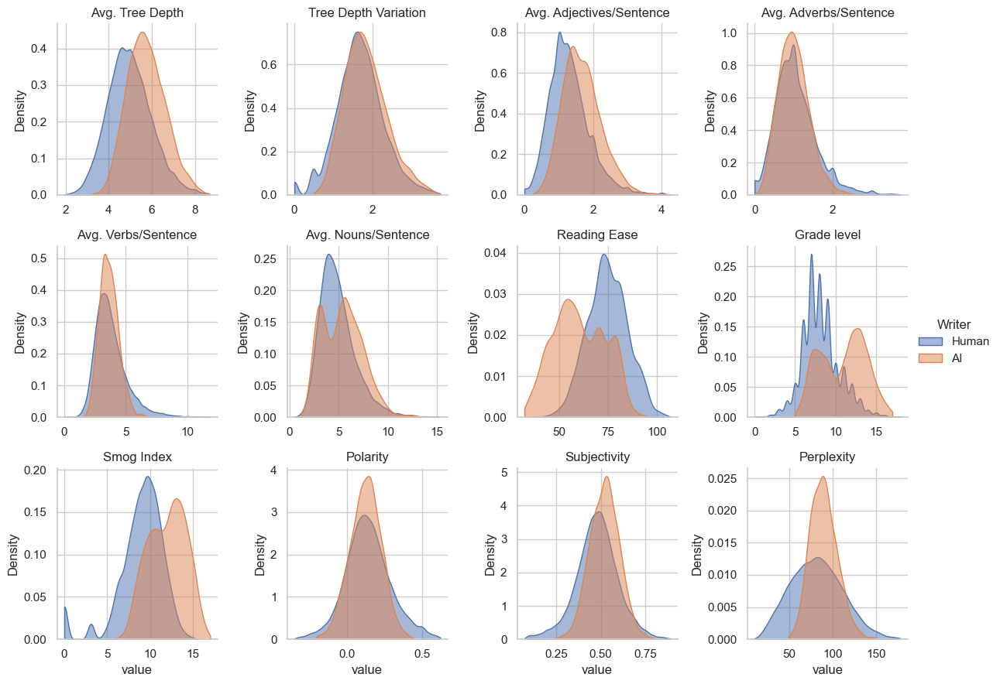

In [16]:
#Small multiple density plot with Last 10 features

# set seaborn whitegrid theme
sns.set(style="whitegrid")

# using small multiple
# create a grid 
g = sns.FacetGrid(df_subset2_long, col='feature', hue='ai_generated', col_wrap=4, sharex = False, sharey = False)

# draw density plots
g = g.map(sns.kdeplot,"value", cut=0, fill=True, common_norm=False, alpha=0.5, legend=True, label = "ai_generated")

# control the title of each facet
g = g.set_titles("{col_name}")

g.add_legend(title = "Writer")



sns.FacetGrid.savefig(g, "../output/densityplot_sub2.png")

# show the graph
plt.show()

In [19]:
#calculate point-biserial correlation for each feature

#convert ai_generated to dichotomous 0/1
df_fig["ai"] = df_fig["ai_generated"].replace({"Human": 0, "AI" : 1})

#get vector of features to analyze
feature_var = df_fig.columns[2:len(df_fig.columns)]

In [21]:
print(df_fig)
print(feature_var)

      ai_generated  Word Count  Avg. Word Length  avg_sentence_length  \
0            Human         386          3.984456            21.125000   
1            Human         464          4.030172            20.950000   
2            Human         313          4.035144            19.928571   
3            Human         611          4.328969            19.407407   
4            Human         517          4.071567            15.500000   
...            ...         ...               ...                  ...   
24412           AI         274          4.664234            20.166667   
24413           AI         247          4.619433            18.000000   
24414           AI         216          4.717593            15.583333   
24415           AI         272          4.977941            19.916667   
24416           AI         281          4.569395            15.437500   

       Type-Token Ratio  Stop Word Count  Unique Word Count  Rare Word Count  \
0              0.468912              176   

In [22]:


#create list of correlation and p-value
r = []
p = []
feature_stat = []

#loop through each feature, calculating the correlation and saving in the created r and p lists, saving feature name too.
for feature in feature_var:
    try:
        correlation, p_value = stats.pointbiserialr(df_fig.loc[:, "ai"].astype(float), df_fig.loc[:, feature].astype(float))
        r.append(correlation)
        p.append(p_value)
        feature_stat.append(feature)

    except:
        print(f"{feature} error")

In [26]:
pointbsr = pd.DataFrame({"Point-Biserial Correlation" : r, "p-value" : p, "Feature" : feature_stat})

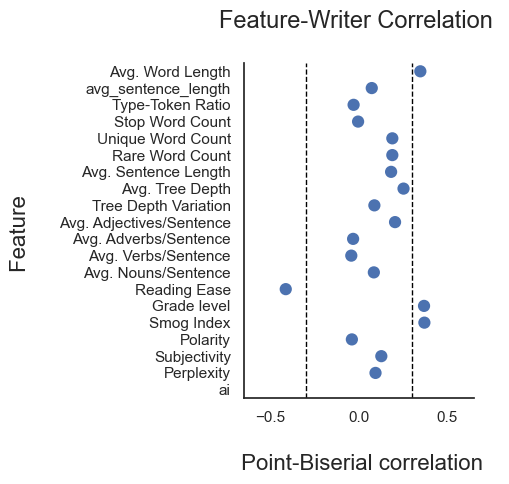

In [27]:
#graph the point-biserial correlation

# set seaborn default theme (grid lines looked unappealing)
g = sns.set_theme(style="white")

# draw pointplot
g = sns.catplot(data = pointbsr, x = "Point-Biserial Correlation", y = "Feature", kind = "point", join = False)

#specify the vertical lines to demonstrate cut-point for high correlation
g.refline(x = -.3,
          color = "black",
         lw = 1)

g.refline(x = +.3,
          color = "black",
         lw = 1)

#specify the limits of the x axis 
g.set(xlim=(-.65, .65))

#specify title, xtitle, ytitle
plt.title("Feature-Writer Correlation \n", fontsize=17)
plt.xlabel("\n Point-Biserial correlation", fontsize=16)
plt.ylabel("Feature \n", fontsize=16)

#use tight layout 
plt.tight_layout()

#save figure
plt.savefig("../output/correlation.png", bbox_inches="tight")

#show the plot
plt.show()

In [ ]:
### Attempting an Interactive Visualization

In [ ]:
import plotly.express as px



In [32]:
# distribution in facets
px.histogram(df_long,x='value',color='ai_generated',animation_frame='feature') #facet_col means use different facets for different columns
